In [14]:
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import anndata as ad
from anndata import AnnData
import seaborn as sns; sns.set(color_codes=True)
import cupy as cp
import rapids_singlecell as rsc
import stlearn as st

import rmm
from rmm.allocators.cupy import rmm_cupy_allocator
rmm.reinitialize(
    managed_memory=False, # Allows oversubscription
    pool_allocator=False, # default is False
    devices=0, # GPU device IDs to register. By default registers only GPU 0.
)
cp.cuda.set_allocator(rmm_cupy_allocator)

# clr normalization method courtesy of maximz
# https://github.com/scverse/scanpy/issues/1208
def clr_normalize_each_cell(adata, inplace=True):
    """Normalize count vector for each cell, i.e. for each row of .X"""

    import numpy as np
    import scipy

    def seurat_clr(x):
        # TODO: support sparseness
        s = np.sum(np.log1p(x[x > 0]))
        exp = np.exp(s / len(x))
        return np.log1p(x / exp)

    if not inplace:
        adata = adata.copy()

    # apply to dense or sparse matrix, along axis. returns dense matrix
    adata.X = np.apply_along_axis(
        seurat_clr, 1, (adata.X.A if scipy.sparse.issparse(adata.X) else adata.X)
    )
    return adata

def convertTMAName(name):
    row, col = name.split('-')
    row = ord(row)-ord('A')+1
    col = chr(int(col)+64)
    return (col+str(row))

In [15]:
df = pd.read_csv('AW_Anand_Neruo_TMA_05162024_Scan1.txt', sep='\t', lineterminator='\n')
print(df.head())

# create the cell matrix
df_mat = df[df.columns[df.columns.str.contains("Cell: Mean")]]
# leave only protein names
df_mat.columns = df_mat.columns.str.replace(': Cell: Mean', '')
df_mat.index = df_mat.index + 1

# create the metadata file
df_meta = df[['Centroid X µm','Centroid Y µm','Nucleus: Area µm^2']].copy()
# calculate the cytoplasm as the cell minus the nucleus
df_meta.loc[:, 'Cytoplasm: Area µm^2'] = df['Cell: Area µm^2'].sub(df['Nucleus: Area µm^2'])
# need to increase the index by 1 so that it doesn't start at 0
df_meta.index = df_meta.index + 1

spatial = df_meta[['Centroid X µm', 'Centroid Y µm']]
spatial = spatial.rename(columns={'Centroid X µm': 'imagecol', 'Centroid Y µm': 'imagerow'})

adata = st.create_stlearn(count=df_mat,spatial=spatial,
                                    library_id="Sample_test", scale=1,background_color="white")

adata.obs['batch'] = df['TMA core'].values
adata.obs['cellSize'] = df['Cell: Area µm^2'].values

                                               Image  \
0  AW_Anand_Neuro_TMA_05162024_Scan1.qptiff - res...   
1  AW_Anand_Neuro_TMA_05162024_Scan1.qptiff - res...   
2  AW_Anand_Neuro_TMA_05162024_Scan1.qptiff - res...   
3  AW_Anand_Neuro_TMA_05162024_Scan1.qptiff - res...   
4  AW_Anand_Neuro_TMA_05162024_Scan1.qptiff - res...   

                              Object ID Object type  Name  Classification  \
0  6728f8b6-7b51-4292-bcc1-4e22138057b9        Cell   NaN             NaN   
1  ceb02fc6-5e2b-466e-9fda-935e977024b4        Cell   NaN             NaN   
2  f5cfe099-1fe0-45de-8da2-ad2e70e2c207        Cell   NaN             NaN   
3  0f6d715a-def0-44e3-8597-d3ffdbcfd078        Cell   NaN             NaN   
4  e67cc93d-e529-44d9-a20e-2ba95b0d2e34        Cell   NaN             NaN   

  TMA core Parent      ROI  Centroid X µm  Centroid Y µm  ...  \
0      A-2    A-2  Polygon         3102.5         1111.8  ...   
1      A-2    A-2  Polygon         2955.0         1173.1  ...   
2    

/home/lzhang36/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 1187588 × 31
    obs: 'imagecol', 'imagerow', 'batch', 'cellSize', 'tissueType'
    uns: 'spatial'
    obsm: 'spatial'
View of AnnData object with n_obs × n_vars = 1164466 × 31
    obs: 'imagecol', 'imagerow', 'batch', 'cellSize', 'tissueType'
    uns: 'spatial'
    obsm: 'spatial'


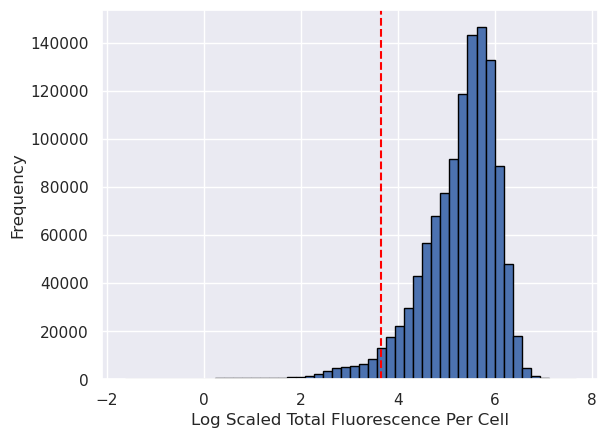

View of AnnData object with n_obs × n_vars = 1164466 × 30
    obs: 'imagecol', 'imagerow', 'batch', 'cellSize', 'tissueType'
    uns: 'spatial'
    obsm: 'spatial'
View of AnnData object with n_obs × n_vars = 1116420 × 30
    obs: 'imagecol', 'imagerow', 'batch', 'cellSize', 'tissueType'
    uns: 'spatial'
    obsm: 'spatial'


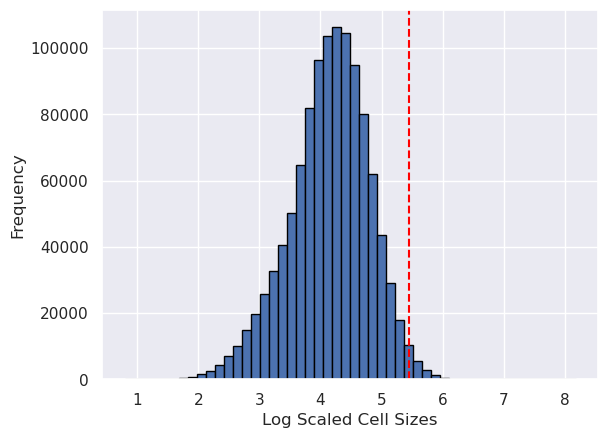

View of AnnData object with n_obs × n_vars = 1116420 × 30
    obs: 'imagecol', 'imagerow', 'batch', 'cellSize', 'tissueType'
    uns: 'spatial'
    obsm: 'spatial'
View of AnnData object with n_obs × n_vars = 1101458 × 30
    obs: 'imagecol', 'imagerow', 'batch', 'cellSize', 'tissueType'
    uns: 'spatial'
    obsm: 'spatial'


/home/lzhang36/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1294: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/lzhang36/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1294: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [16]:
# rename the TMAs to Anand's specification
TMANames = adata.obs['batch'].to_numpy()
for i in range(len(TMANames)):
    TMANames[i] = convertTMAName(TMANames[i])
adata.obs['batch'] = TMANames

# figure out what is cancer and what is normal
normalTMAs = ['B1','C1','D1','E1','F1','G1','A2','B2','C2','D2','E2',
              'F2']

adata.obs['tissueType'] = ''
adata.obs['tissueType'] = adata.obs['tissueType'].astype(str)

for tma in adata.obs['batch'].unique():
    if tma in normalTMAs:
        adata.obs.loc[adata.obs['batch'] == tma, 'tissueType'] = 'Normal'
    else:
        adata.obs.loc[adata.obs['batch'] == tma, 'tissueType'] = 'Cancer'

# filter by DAPI
print(adata)
adata = adata[adata[:, 'DAPI'].X > 10, :]
print(adata)

genes_to_remove = ['DAPI']
adata = adata[:,~adata.var_names.isin(genes_to_remove)]

# filter by fluorescence
matrix = adata.X
cutoff_std = np.mean(np.log(np.sum(matrix, axis=1)))-2*(np.std(np.log(np.sum(matrix, axis=1))))
plt.hist(np.log(np.sum(matrix, axis=1)), bins=50, edgecolor='black')
plt.ylabel('Frequency')
plt.xlabel('Log Scaled Total Fluorescence Per Cell')
plt.axvline(x=cutoff_std, color='red', linestyle='--')
plt.show()

print(adata)
idx = np.where(np.log(np.sum(matrix, axis=1)) > cutoff_std)[0]
adata = adata[idx,:]
print(adata)

# filter by cell size
cellSizes = adata.obs['cellSize'].values
cutoff_std = np.mean(np.log(cellSizes))+2*(np.std(np.log(cellSizes)))
plt.hist(np.log(cellSizes), bins=50, edgecolor='black')
plt.ylabel('Frequency')
plt.xlabel('Log Scaled Cell Sizes')
plt.axvline(x=cutoff_std, color='red', linestyle='--')
plt.show()

print(adata)
idx = np.where(np.log(cellSizes) < cutoff_std)[0]
adata = adata[idx,:]
print(adata)

# normalization
for tma in adata.obs['batch'].unique():
    clr_normalize_each_cell(adata[adata.obs['batch']==tma])

# saving adata for batch correction
adata.write_h5ad('adata.h5ad')
adata[adata.obs['tissueType']=='Normal'].write_h5ad('adata_N.h5ad')
adata[adata.obs['tissueType']=='Cancer'].write_h5ad('adata_C.h5ad')

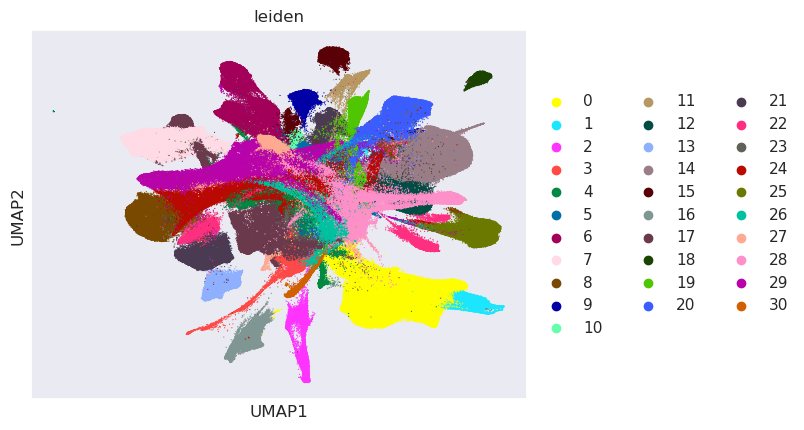

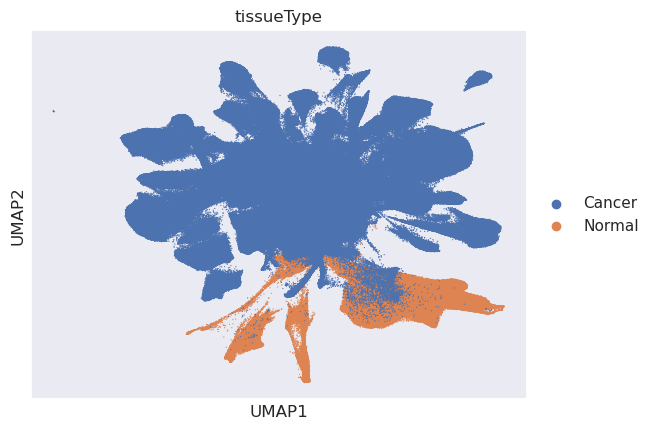

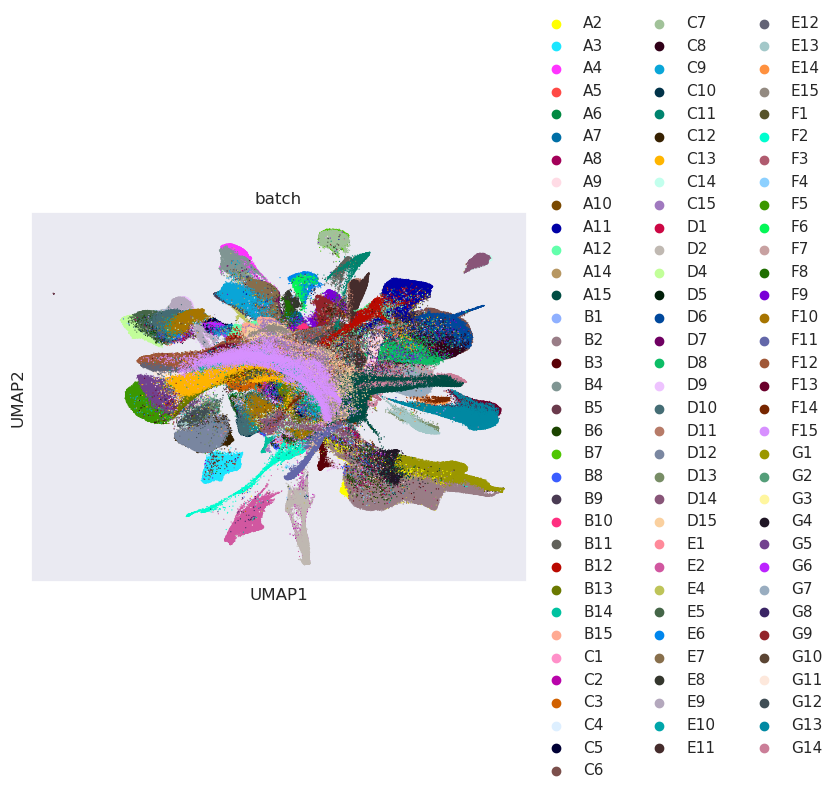

Scale step is finished in adata.X


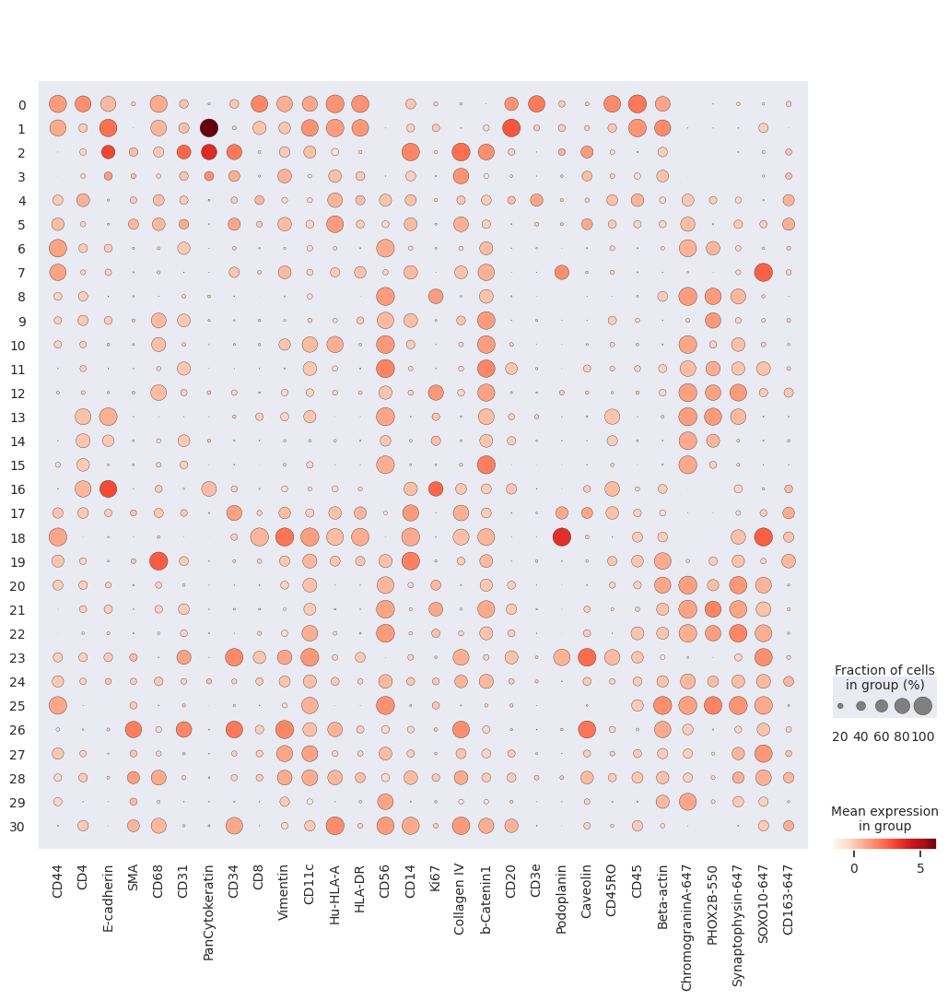

In [20]:
# adata = ad.read_h5ad('adata_batched.h5ad')
# adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']
adata = ad.read_h5ad('adata.h5ad')

rsc.pp.pca(adata, n_comps=30)
rsc.pp.neighbors(adata, n_neighbors=30, n_pcs=30, use_rep='X_pca')
rsc.tl.umap(adata)
rsc.tl.leiden(adata, resolution=0.25)
sc.pl.umap(adata, color=['leiden'], size=3)
sc.pl.umap(adata, color=['tissueType'], size=3)
sc.pl.umap(adata, color=['batch'], size=3)

st.pp.scale(adata)
sc.pl.dotplot(adata, adata.var_names.to_list(), groupby='leiden', dendrogram=False)

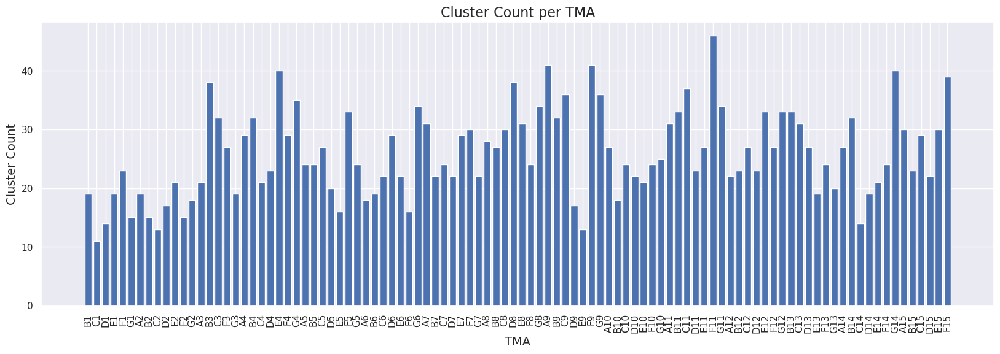

In [18]:
df_cpt = pd.DataFrame(columns=['TMA', 'ClusterCount'])


rows = range(1, 16)
cols = [chr(i) for i in range(ord('A'), ord('G') + 1)]
all_positions = [f'{c}{r}' for r in rows for c in cols]

for pos in all_positions:
    if len(adata[adata.obs['batch']==pos]) != 0:
        df_cpt.loc[len(df_cpt)] = [pos, len(adata[adata.obs['batch']==pos].obs['leiden'].unique())]

fig, ax = plt.subplots(figsize=(20, 6))

# Plot the bar plot
ax.bar(df_cpt['TMA'], df_cpt['ClusterCount'])

# Set the title and axis labels
ax.set_title('Cluster Count per TMA', fontsize=16)
ax.set_xlabel('TMA', fontsize=14)
ax.set_ylabel('Cluster Count', fontsize=14)

# Rotate the x-axis labels for better visibility
plt.xticks(rotation=90)

# Show the plot
plt.show()

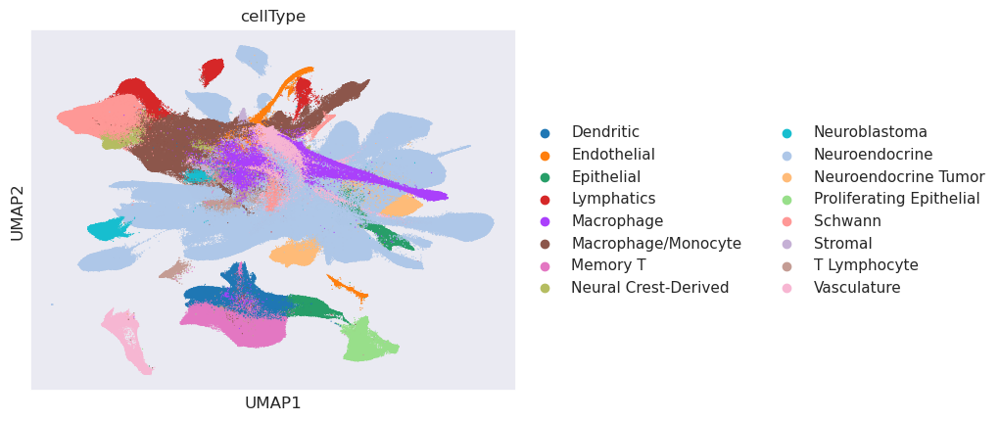

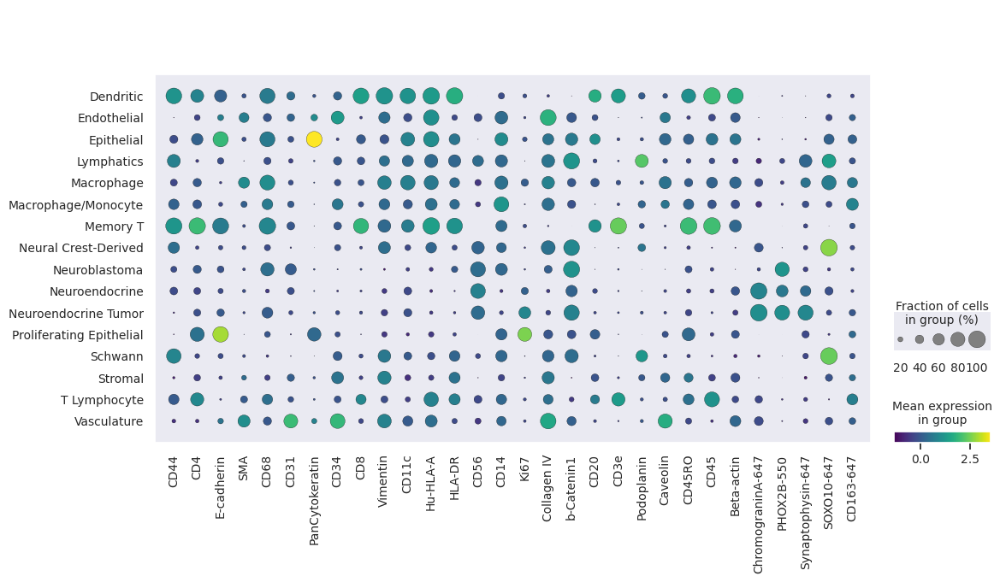

In [26]:
cellTypes = ['Dendritic', 'Memory T', 'Epithelial', 'Proliferating Epithelial', 'Neuroendocrine Tumor', 'Neuroendocrine',
             'Neuroendocrine', 'Neuroendocrine', 'Macrophage/Monocyte', 'Neuroendocrine', 'Macrophage/Monocyte',
             'Neuroendocrine', 'Neuroendocrine Tumor', 'Neural Crest-Derived', 'Vasculature', 'Stromal', 'Neuroendocrine',
             'T Lymphocyte', 'Neuroendocrine', 'Epithelial', 'Lymphatics', 'Neuroendocrine', 'Schwann', 'Lymphatics',
             'Macrophage/Monocyte', 'Neuroblastoma', 'Neuroendocrine', 'Neuroendocrine', 'Neuroendocrine', 'Neuroendocrine',
             'Neuroendocrine', 'Vasculature', 'Schwann', 'Lymphatics', 'Neuroendocrine', 'Macrophage', 'Endothelial',
             'Neuroendocrine']

adata.obs['cellType'] = ''
adata.obs['cellType'] = adata.obs['cellType'].astype(str)

i = 0
for c in np.sort(adata.obs['leiden'].astype(int).unique()):
    adata.obs.loc[adata.obs['leiden'] == str(c), 'cellType'] = cellTypes[i]
    i = i+1

sc.pl.umap(adata, color=['cellType'], size=3)
sc.pl.dotplot(adata, adata.var_names.to_list(), groupby='cellType', dendrogram=False, cmap='viridis')

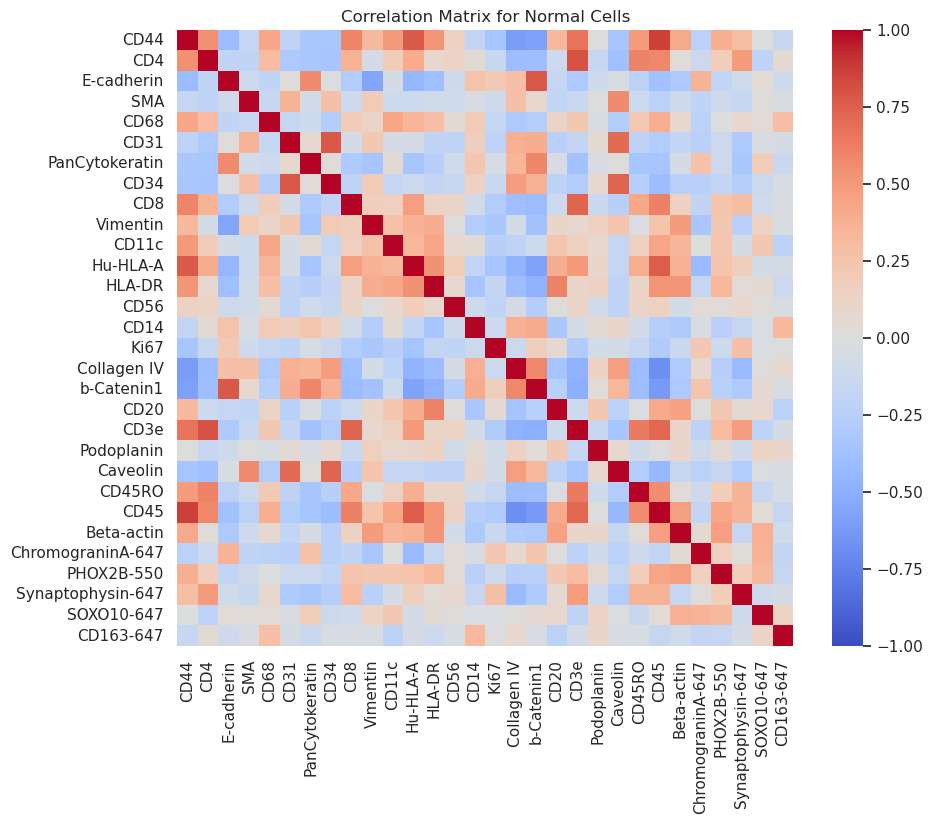

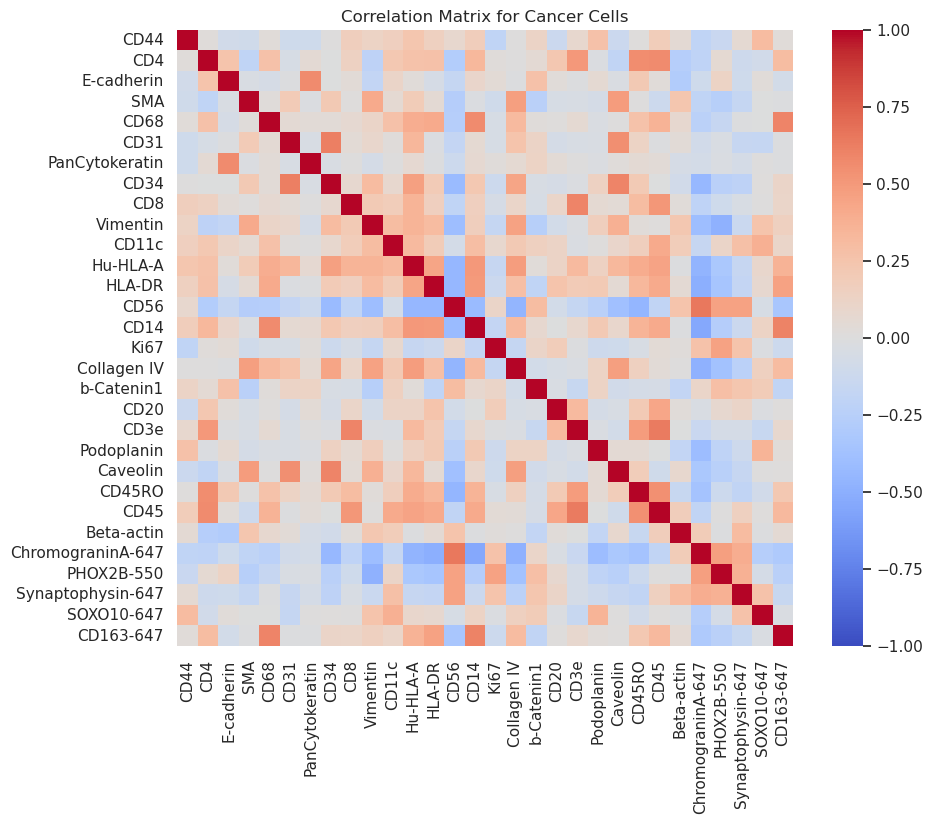

In [7]:
gene_expr = adata[adata.obs['tissueType']=='Normal'].X
gene_names = adata.var_names

# Calculate the correlation matrix
corr_matrix = np.corrcoef(gene_expr.T)

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corr_matrix, xticklabels=gene_names, yticklabels=gene_names, vmax=1, vmin=-1, square=True, cmap="coolwarm", annot=False, ax=ax)
ax.set_title('Correlation Matrix for Normal Cells')
plt.show()

gene_expr = adata[adata.obs['tissueType']=='Cancer'].X
gene_names = adata.var_names

# Calculate the correlation matrix
corr_matrix = np.corrcoef(gene_expr.T)

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corr_matrix, xticklabels=gene_names, yticklabels=gene_names, vmax=1, vmin=-1, square=True, cmap="coolwarm", annot=False, ax=ax)
ax.set_title('Correlation Matrix for Cancer Cells')
plt.show()

/tmp/ipykernel_836833/1608004798.py:55: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


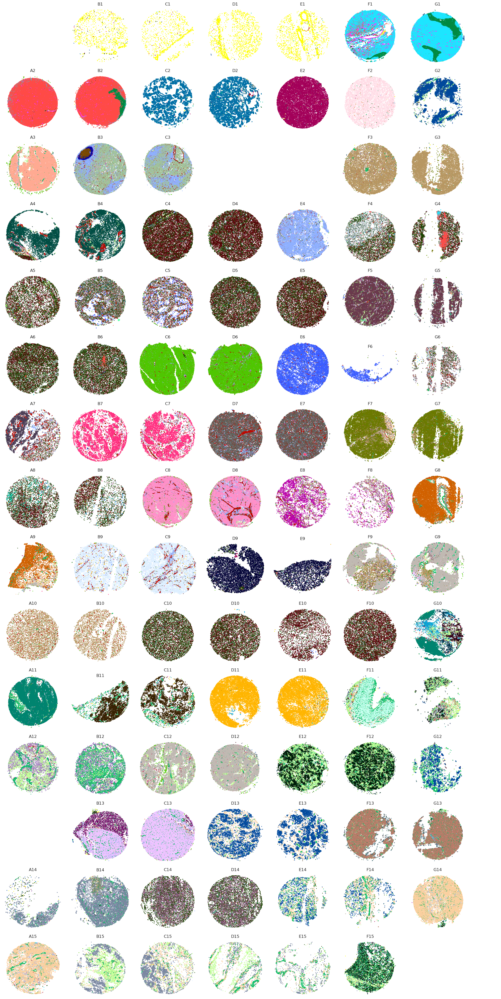

In [19]:
import warnings
from anndata import ImplicitModificationWarning
warnings.filterwarnings("ignore", category=UserWarning, module="scanpy")
warnings.filterwarnings("ignore", category=ImplicitModificationWarning)

# Create a list of TMA positions
'''rows = [chr(i) for i in range(ord('A'), ord('O') + 1)]
cols = range(1, 8)
all_positions = [f'{r}-{c}' for r in rows for c in cols]'''

rows = range(1, 16)
cols = [chr(i) for i in range(ord('A'), ord('G') + 1)]
all_positions = [f'{c}{r}' for r in rows for c in cols]

# Get the unique TMAs from the data
TMAs = adata.obs['batch'].unique()

# Create the figure and axes
fig, axes = plt.subplots(nrows=15, ncols=7, figsize=(20, 40))

# Plot each TMA in the correct position, leaving blanks for missing TMAs
for pos, ax in zip(all_positions, axes.flat):
    if pos in TMAs:
        sc.pl.embedding(adata[adata.obs['batch'] == pos], basis='spatial', color='leiden', ax=ax, show=False, size=15)
        ax.set_title(f'{pos}')
    else:
        ax.set_facecolor('white')  # Set blank background for missing TMAs
        ax.axis('off')  # Remove axes for missing TMAs
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_aspect('equal')
    ax.set_facecolor('white')
    legend = ax.get_legend()
    if legend:
        legend.remove()

# Hide any remaining subplots that aren't used
for ax in axes.flat[len(all_positions):]:
    ax.axis('off')

# Create a new axis for the legend
legend_ax = fig.add_axes([0.96, 0.1, 0.04, 0.8])
legend_ax.axis('off')

# Check if any subplot has a legend
first_non_empty_plot = next((ax for ax in axes.flat if ax.get_legend()), None)
if first_non_empty_plot:
    legend_handles, legend_labels = first_non_empty_plot.get_legend_handles_labels()

    # Create the legend in the new axis
    legend_ax.legend(legend_handles, legend_labels, loc='center')

# Set the overall title and layout
# fig.suptitle('Neuro TMA Leiden Clustering', fontsize=20)
plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()

/tmp/ipykernel_773786/980331899.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1])


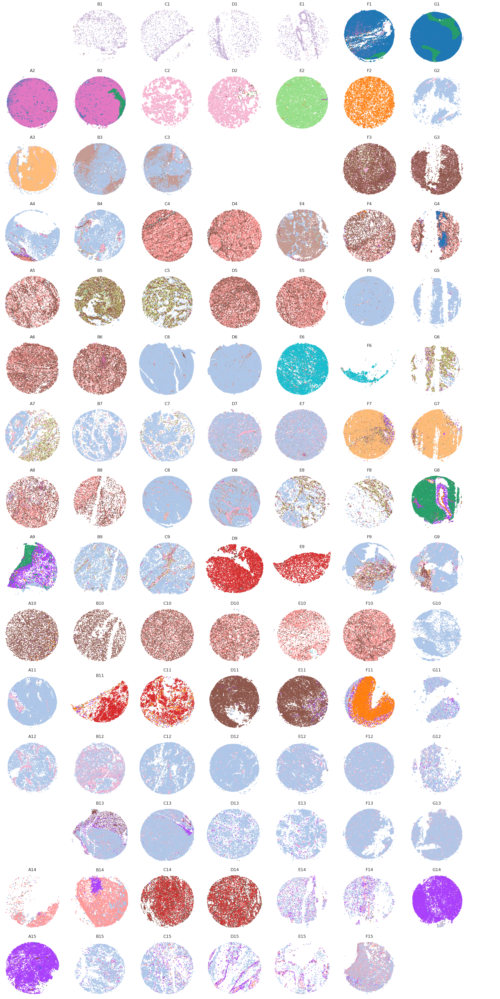

In [25]:
import warnings
from anndata import ImplicitModificationWarning
warnings.filterwarnings("ignore", category=UserWarning, module="scanpy")
warnings.filterwarnings("ignore", category=ImplicitModificationWarning)

# Create a list of TMA positions
rows = range(1, 16)
cols = [chr(i) for i in range(ord('A'), ord('G') + 1)]
all_positions = [f'{c}{r}' for r in rows for c in cols]

# Get the unique TMAs from the data
TMAs = adata.obs['batch'].unique()

# Create the figure and axes
fig, axes = plt.subplots(nrows=15, ncols=7, figsize=(20, 40))

# Plot each TMA in the correct position, leaving blanks for missing TMAs
for pos, ax in zip(all_positions, axes.flat):
    if pos in TMAs:
        sc.pl.embedding(adata[adata.obs['batch'] == pos], basis='spatial', color='cellType', ax=ax, show=False, size=15)
        ax.set_title(f'{pos}')
    else:
        ax.set_facecolor('white')  # Set blank background for missing TMAs
        ax.axis('off')  # Remove axes for missing TMAs
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_aspect('equal')
    ax.set_facecolor('white')
    legend = ax.get_legend()
    if legend:
        legend.remove()

# Hide any remaining subplots that aren't used
for ax in axes.flat[len(all_positions):]:
    ax.axis('off')

# Create a new axis for the legend
legend_ax = fig.add_axes([0.96, 0.1, 0.04, 0.8])
legend_ax.axis('off')

# Check if any subplot has a legend
first_non_empty_plot = next((ax for ax in axes.flat if ax.get_legend()), None)
if first_non_empty_plot:
    legend_handles, legend_labels = first_non_empty_plot.get_legend_handles_labels()

    # Create the legend in the new axis
    legend_ax.legend(legend_handles, legend_labels, loc='center')

# Set the overall title and layout
# fig.suptitle('Neuro TMA Manual Cell Annotations', fontsize=20)
plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()